In [543]:
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
import plotly.express as px
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score as ss


import joblib
import warnings
warnings.filterwarnings(action='ignore') 
seed = 43

# Train
## Data Load -> Scailing -> SVD -> GMM 

In [544]:
train_df = pd.read_csv("./dataset/train_data.csv")

In [545]:
# train_df.profile_report()

In [546]:
features = train_df.columns[:-1]
features

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe'],
      dtype='object')

In [547]:
X_train = train_df[features]
y_train = train_df[['type']]


In [548]:
sc = StandardScaler()
X_train[features]= sc.fit_transform(X_train)
X_train.head(2)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe
0,-0.448257,-0.917212,-1.110223e-16,-0.511748,-1.007046,-0.910351,-0.331821
1,0.699749,1.178320,-1.110223e-16,0.802045,1.118785,1.172883,0.188462


In [549]:
train_df = X_train
train_df['type'] = y_train
train_df.head(2)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type
0,-0.448257,-0.917212,-1.110223e-16,-0.511748,-1.007046,-0.910351,-0.331821,0
1,0.699749,1.178320,-1.110223e-16,0.802045,1.118785,1.172883,0.188462,0


In [550]:
# train_df.profile_report()

In [551]:
g1 = ['air_inflow','motor_current']
g2 = ['air_end_temp', 'motor_rpm', 'motor_temp']
g3 = ['motor_vibe', 'out_pressure']

g1_train = train_df[g1]
g2_train = train_df[g2]
g3_train = train_df[g3]
y_train = train_df[['type']]
combined_train = [g1_train, g2_train, g3_train]

svd= TruncatedSVD(n_components=1, n_iter=10, random_state=seed)
svd_list = []
for i in combined_train:
    result = svd.fit_transform(i)
    svd_list.append(result)
    total_var = svd.explained_variance_ratio_.sum() * 100
    print(f"{i}explained_variance_ratio : {total_var}")
    
flat_svd_list = []
for i in svd_list:
    result = [j for sub in i for j in sub]
    flat_svd_list.append(result)
svd_train_df = pd.DataFrame({"PC1": flat_svd_list[0], "PC2": flat_svd_list[1], "PC3": flat_svd_list[2]})
svd_train_df = pd.concat([svd_train_df, y_train], axis=1)
svd_train_df.info()

      air_inflow  motor_current
0      -0.448257      -0.511748
1       0.699749       0.802045
2      -0.182053      -0.202966
3       0.200616       0.230799
4      -0.190372      -0.208848
...          ...            ...
2458    0.125746       0.149927
2459   -0.073907      -0.084600
2460   -0.781013      -0.889638
2461   -0.764375      -0.871259
2462    0.491777       0.566048

[2463 rows x 2 columns]explained_variance_ratio : 99.72924966859078
      air_end_temp  motor_rpm  motor_temp
0        -0.917212  -1.007046   -0.910351
1         1.178320   1.118785    1.172883
2        -0.425427  -0.508305   -0.421612
3         0.266970   0.194005    0.265958
4        -0.434598  -0.517029   -0.430592
...            ...        ...         ...
2458      0.137432   0.063140    0.137680
2459     -0.236279  -0.316369   -0.234326
2460     -1.520194  -1.619204   -1.510693
2461     -1.490389  -1.588669   -1.481189
2462      0.801170   0.736368    0.798312

[2463 rows x 3 columns]explained_variance_

In [552]:
tdf0_train = svd_train_df[svd_train_df.type == 0]
tdf1_train = svd_train_df[svd_train_df.type == 1]
tdf2_train = svd_train_df[svd_train_df.type == 2]
tdf3_train = svd_train_df[svd_train_df.type == 3]
tdf4_train = svd_train_df[svd_train_df.type == 4]
tdf5_train = svd_train_df[svd_train_df.type == 5]
tdf6_train = svd_train_df[svd_train_df.type == 6]
tdf7_train = svd_train_df[svd_train_df.type == 7]
tdf_train = [tdf0_train, tdf1_train, tdf2_train, tdf3_train, tdf4_train, tdf5_train, tdf6_train, tdf7_train]

In [553]:
def draw_chart_type(df):
    title = f"type {str(df.type.unique()[0])}"
    fig = px.scatter_3d(
        df, x='PC1', y='PC2', z='PC3', color='type',symbol='type', opacity=0.5, size_max=10,height=800,title=title,
    )
    fig.show()

In [554]:
# for tdf in tdf_train:
#     draw_chart_type(tdf)

In [555]:
X = svd_train_df.iloc[:,:-1]
n_components = np.arange(1,10)
gmm_models = [GaussianMixture(n, covariance_type='spherical').fit(X) for n in n_componets]

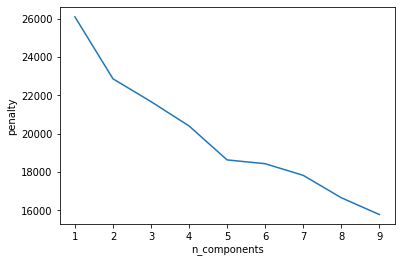

In [556]:
plt.plot(n_components, [m.bic(X) for m in gmm_models], label='BIC')
plt.xlabel('n_components')
plt.ylabel('penalty')
plt.show()

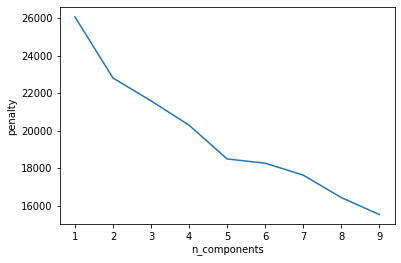

In [557]:
plt.plot(n_components, [m.aic(X) for m in gmm_models], label='AIC')
plt.xlabel('n_components')
plt.ylabel('penalty')
plt.show()

In [558]:
gm = GaussianMixture(n_components=40, covariance_type='spherical', random_state=seed).fit(X)
labels = gm.predict(X)
proba = gm.predict_proba(X)
new_probas = []
for i in proba:
    k = np.around(i.astype(np.double), 6)
    new_probas.append(k)
new_probas

[array([0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 9.99997e-01, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 3.00000e-06,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00]),
 array([0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        9.99955e-01, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.

In [559]:
# models =[]
# for df in tdf_train:
#     X = df.iloc[:,:-1]
#     gm = GaussianMixture(n_components=20, random_state=seed).fit(X)
#     models.append(gm)

In [560]:
# models

In [561]:
# labels = []
# probas = []
# for model, df in zip(models, tdf_train):
#     X = df.iloc[:,:-1]
#     label =  model.predict(X)
#     proba = model.predict_proba(X)
#     labels.extend(label)
#     probas.extend(proba)

In [562]:
# new_probas = []
# for i in probas:
#     k = np.around(i.astype(np.double), 3)
#     new_probas.append(k)
# new_probas

In [563]:
svd_train_df['label'] = labels
svd_train_df['proba'] = new_probas
svd_train_df['label'].value_counts()

12    138
27    131
39    130
3     118
0     116
16    112
25    107
14    106
31    104
5     104
37    100
1      89
10     67
33     56
9      53
32     50
34     50
8      50
6      48
21     47
22     46
28     44
13     43
11     42
17     42
30     42
29     42
19     40
15     40
35     39
26     38
7      37
20     35
23     34
4      31
36     28
24     27
38     21
18     11
2       5
Name: label, dtype: int64

In [564]:
svd_train_df.head(3)

,PC1,PC2,PC3,type,label,proba
0,-0.678826,1.636428,-0.331821,0,12,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,1.061929,-2.003479,0.188462,0,10,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,-0.272250,0.782386,-0.211268,0,0,"[0.990243, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [591]:
train_result = svd_train_df.groupby(['type', 'label'])['proba'].count().reset_index()
train_result.to_csv('train.csv', encoding="utf-8-sig")

In [566]:
# tdf0_train = svd_train_df[svd_train_df.type == 0]
# tdf1_train = svd_train_df[svd_train_df.type == 1]
# tdf2_train = svd_train_df[svd_train_df.type == 2]
# tdf3_train = svd_train_df[svd_train_df.type == 3]
# tdf4_train = svd_train_df[svd_train_df.type == 4]
# tdf5_train = svd_train_df[svd_train_df.type == 5]
# tdf6_train = svd_train_df[svd_train_df.type == 6]
# tdf7_train = svd_train_df[svd_train_df.type == 7]
# tdf_train = [tdf0_train, tdf1_train, tdf2_train, tdf3_train, tdf4_train, tdf5_train, tdf6_train, tdf7_train]

In [567]:
def draw_chart_label(df):
    title = f"type {str(df.type.unique()[0])}"
    fig = px.scatter_3d(
        df, x='PC1', y='PC2', z='PC3', color='label',symbol='type', opacity=0.5, size_max=10,height=800,title=title,hover_name='proba',
    )
    fig.show()

In [568]:
draw_chart_label(svd_train_df)

In [569]:
# for tdf in tdf_train:
#     draw_chart_label(tdf)

# Test
## Data Load -> Scailing -> SVD -> GMM predict -> Get Label

In [570]:
test_df = pd.read_csv("./dataset/test_data.csv")
X_test = test_df[features]
y_test = test_df[['type']]

In [571]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7389 entries, 0 to 7388
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   air_inflow     7389 non-null   float64
 1   air_end_temp   7389 non-null   float64
 2   out_pressure   7389 non-null   float64
 3   motor_current  7389 non-null   float64
 4   motor_rpm      7389 non-null   int64  
 5   motor_temp     7389 non-null   float64
 6   motor_vibe     7389 non-null   float64
 7   type           7389 non-null   int64  
dtypes: float64(6), int64(2)
memory usage: 461.9 KB


In [572]:
sc = StandardScaler()
X_test[features]= sc.fit_transform(X_test)
X_test.head(2)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe
0,0.349570,0.487848,0.029701,0.387062,0.419055,0.491978,0.208765
1,0.478445,0.713509,0.029701,0.531396,0.647355,0.716757,0.348482


In [573]:
test_df = X_test
test_df['type'] = y_test
test_df.head(2)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type
0,0.349570,0.487848,0.029701,0.387062,0.419055,0.491978,0.208765,0
1,0.478445,0.713509,0.029701,0.531396,0.647355,0.716757,0.348482,0


In [574]:
g1_test = test_df[g1]
g2_test = test_df[g2]
g3_test = test_df[g3]
y_test = test_df[['type']]
combined_test = [g1_test, g2_test, g3_test]

svd = TruncatedSVD(n_components=1, n_iter=10, random_state=seed)
svd_list = []
for i in combined_test:
    result = svd.fit_transform(i)
    svd_list.append(result)
    total_var =svd.explained_variance_ratio_.sum() * 100
    print(f"{i}total_var : {total_var}")
    
flat_svd_list = []
for i in svd_list:
    result = [j for sub in i for j in sub]
    flat_svd_list.append(result)
svd_test_df = pd.DataFrame({"PC1": flat_svd_list[0], "PC2": flat_svd_list[1], "PC3": flat_svd_list[2]})
svd_test_df = pd.concat([svd_test_df, y_test], axis=1)
svd_test_df.info()

      air_inflow  motor_current
0       0.349570       0.387062
1       0.478445       0.531396
2      -0.329171      -0.392040
3       0.083228       0.081769
4      -0.037055      -0.056520
...          ...            ...
7384    0.014495       0.002423
7385   -0.535371      -0.621765
7386   -0.466638      -0.549220
7387   -0.440863      -0.521260
7388   -0.346355      -0.408664

[7389 rows x 2 columns]total_var : 99.55080635654565
      air_end_temp  motor_rpm  motor_temp
0         0.487848   0.419055    0.491978
1         0.713509   0.647355    0.716757
2        -0.725652  -0.806787   -0.718468
3         0.012350  -0.060812    0.017876
4        -0.202949  -0.278934   -0.197860
...            ...        ...         ...
7384     -0.110842  -0.185868   -0.104848
7385     -1.083715  -1.168869   -1.076305
7386     -0.970885  -1.053991   -0.962624
7387     -0.927134  -1.010367   -0.918702
7388     -0.752132  -0.832962   -0.744304

[7389 rows x 3 columns]total_var : 99.22881044537637
    

In [575]:
# tdf0_test = svd_test_df[svd_test_df.type == 0]
# tdf1_test = svd_test_df[svd_test_df.type == 1]
# tdf2_test = svd_test_df[svd_test_df.type == 2]
# tdf3_test = svd_test_df[svd_test_df.type == 3]
# tdf4_test = svd_test_df[svd_test_df.type == 4]
# tdf5_test = svd_test_df[svd_test_df.type == 5]
# tdf6_test = svd_test_df[svd_test_df.type == 6]
# tdf7_test = svd_test_df[svd_test_df.type == 7]
# tdf_test = [tdf0_test, tdf1_test, tdf2_test, tdf3_test, tdf4_test, tdf5_test, tdf6_test, tdf7_test]

In [576]:
# labels = []
# probas = []
# for model, df in zip(models, tdf_test):
#     X = df.iloc[:,:-1]
#     label =  model.predict(X)
#     proba = model.predict_proba(X)
#     labels.extend(label)
#     probas.extend(proba)

In [577]:
# new_probas = []
# for i in probas:
#     k = np.around(i.astype(np.double), 3)
#     new_probas.append(k)
# new_probas

In [578]:
X = svd_test_df.iloc[:,:-1]
labels = gm.predict(X)
proba = gm.predict_proba(X)
new_probas = []
for i in proba:
    k = np.around(i.astype(np.double), 6)
    new_probas.append(k)
new_probas

[array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.]),
 array([0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        4.00000e-06, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 9.99996e-01,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00]),
 array([0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 2.17160e-02, 0.00000e+00, 0.00000e+00,
        0

In [579]:
svd_test_df['label'] = labels
svd_test_df['proba'] = new_probas
svd_test_df['label'].value_counts()

39    424
12    393
5     357
27    355
31    354
25    346
0     343
3     339
16    334
14    280
37    272
1     236
8     189
32    188
10    178
33    172
9     159
28    150
19    148
6     142
29    139
26    139
30    137
22    137
7     135
34    134
13    133
23    133
20    130
11    127
17    123
21    121
15    107
24    107
35     86
38     71
4      64
2       7
Name: label, dtype: int64

In [580]:
svd_test_df.head()

,PC1,PC2,PC3,type,label,proba
0,0.520877,-0.807738,0.126617,0,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ..."
1,0.714065,-1.199604,0.225412,0,14,"[0.0, 0.0, 0.0, 0.0, 0.0, 4e-06, 0.0, 0.0, 0.0..."
2,-0.509973,1.299447,-0.389315,0,27,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,0.116671,0.017558,-0.070974,0,16,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,-0.066167,0.392344,-0.169769,0,0,"[0.77235, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0..."


In [590]:
test_result = svd_test_df.groupby(['type', 'label'])['proba'].count().reset_index()
test_result.to_csv('test.csv', encoding="utf-8-sig")

In [582]:
# def 결과정리(label):
#     if label == 0: # 주된 다수 그룹만 정상(0), 나머지는 이상(1)
#         return 0
#     else:
#         return 1

In [583]:
# svd_test_df['label'] = svd_test_df['label'].apply(결과정리)
# svd_test_df['label'].value_counts()

In [584]:
# overall_sil_score = ss(svd_test_df.iloc[:,:-2], svd_test_df['label'])
# print(f"Silhouette Score: {overall_sil_score}")

In [585]:
fig = px.scatter_3d(
    svd_test_df, x='PC1', y='PC2', z='PC3', color='label',symbol='type', opacity=0.5, size_max=10, height=800, hover_name='proba',
    title = "1st GMM Clustering"
)
fig.show()

In [586]:
# fig = px.scatter_3d(
#     svd_test_df[svd_test_df["label"] == 0], x='PC1', y='PC2', z='PC3', color='label',symbol='label', opacity=0.5, size_max=10,height=800,
#     title = "Label 0(정상) Only"
# )
# fig.show()

In [587]:
# fin_X = svd_test_df[['PC1_x', 'PC2_x', 'PC3_x']]
# fin_y = submit_df['label']

# overall_sil_score = ss(fin_X, fin_y)
# print(f"Silhouette Score: {overall_sil_score}")

In [588]:
# submit_df.to_csv('./submits/submit_20230412_04.csv', index=False)